## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Camera calibration

#### 1> Find Corners, Compute calibration matrix and distortion coefficients, distortion correction

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')


# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

    # Draw and display the corners
      #  img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
      #  cv2.imshow('img',img)
      #  cv2.waitKey(500)

#cv2.destroyAllWindows()

#### 2> Calibrate Camera
---

*      mtx: Camera Matrix.
*      dist: Distortion Coefficients.

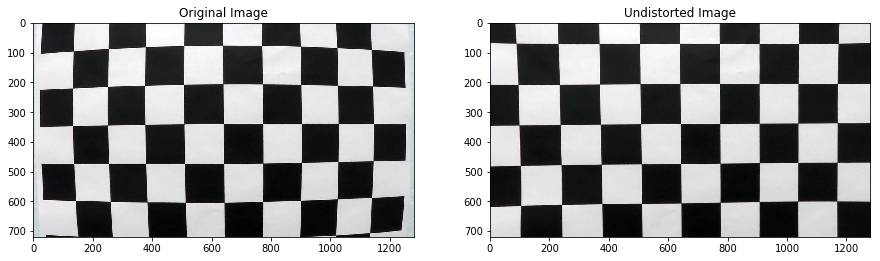

In [2]:
# Camera Calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Show Calibrated images
def images_comparison(number):
    ## Input the number of the chessboard images in the folder
    img = cv2.imread('../camera_cal/calibration' + str(number) + '.jpg')
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.subplot(1, 2, 2)
    plt.imshow(undist)
    plt.title('Undistorted Image')
    
images_comparison(1)

## 2. Color & Gradient Threshold Test on Image Examples

#### 1> Image Undistort and Color & Gradient Thresholding

In [3]:
def ColorGradient_Thresholding(img, r_thresh = (200, 255), s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    ## Undistort Images
    global mts, dist
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    ## Red Channel
    r = img[:,:,0]
    r_binary = np.zeros_like(r)
   # r_binary[(r > r_thresh[0]) & (r <= r_thresh[1])] = 1
     
    ## HLS
    # Convert Image to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    ## Sobel
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), r_binary, sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1) | (r_binary == 1)] = 1
    
    return combined_binary

#### 2> Test on image examples

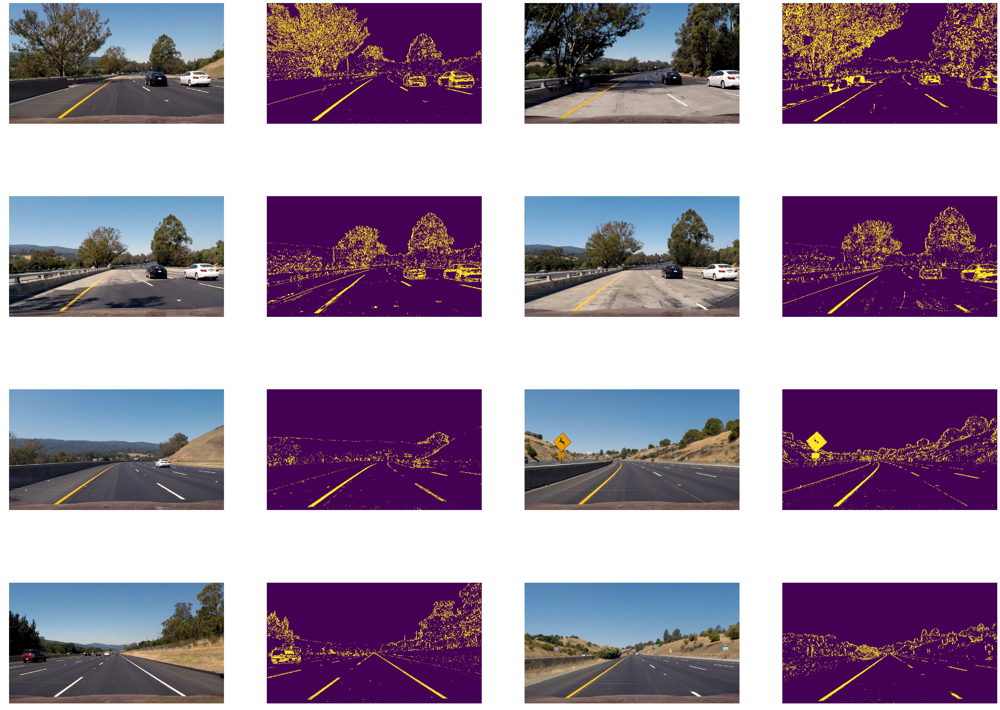

In [4]:
import os
import matplotlib.image as mpimg

names = os.listdir("../test_images/")
input_images = []
processed_images = []


for name in names:
     #reading in an image
    input_image = mpimg.imread("../test_images/"+name)
    input_images.append(input_image)
    processed_image = ColorGradient_Thresholding(input_image)
    processed_images.append(processed_image)
    cv2.imwrite("../output_images/preprocess_and_colorgradient/"+ name + '_output'+".png", processed_image * 200) 
    
    #plt.imshow ("test_images_output/"+ name + '_output'+".jpg") 


plt.figure(figsize=(25, 25))
for i in range(len(processed_images)):
    plt.subplot(4, 4, i * 2 + 1) 
    plt.imshow(input_images[i])
    plt.axis('off')
    plt.subplot(4, 4, i * 2 + 2)
    plt.imshow(processed_images[i])
    plt.axis('off')
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)
        

## 3. Perspective Transform

#### 1> Perpective Transform Function

In [129]:
def perspective_transform(image, offset = 90):
    
    '''
    Perspective Transform of Lane Lines to Bird's Eye View
    Input: Image to transform
           offset: Move tow lines towards center
    Output: Bird's Eye Image
    '''
    
    image = np.copy(image)
    imshape = (image.shape[1], image.shape[0])
    
    
    # Calibrated 4 Point Postions from Straight Line Figures
    upper_factor = 0.29
    bottom_factor = 2.85
    
    # # Define Trapezoidal Region
    src = np.float32([[imshape[0]*(4 -bottom_factor)/8,imshape[1]],[imshape[0]*(4 - upper_factor)/8, imshape[1]*5/8], [imshape[0]*(4 + upper_factor)/8, imshape[1]*5/8], [imshape[0]*(4 + bottom_factor)/8,imshape[1]]])
    
    #plt.imshow(image)
    #plt.plot(imshape[0]*(4 - bottom_factor)/8, imshape[1],'.')
    #plt.plot(imshape[0]*(4 - upper_factor)/8, imshape[1]*5/8, '.')
    #plt.plot(imshape[0]*(4 + upper_factor)/8, imshape[1]*5/8, '.')
    #plt.plot(imshape[0]*(4 + bottom_factor)/8, imshape[1], '.')
    
    
    # Destination Points to a Rectangle
    dst = np.float32([[imshape[0]*(4 - bottom_factor)/8 + offset, imshape[1]], [imshape[0]*(4 - bottom_factor)/8 + offset, 0], 
                                     [imshape[0]*(4 + bottom_factor)/8 -  offset, 0], 
                                     [imshape[0]*(4 + bottom_factor)/8 -  offset, imshape[1]]])
    
    # Get perspective Matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Get inverse perspective matrix for later use
    global Minv
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(image, M, imshape, flags=cv2.INTER_LINEAR)
    
    return warped

   

#### 2> Test on image examples

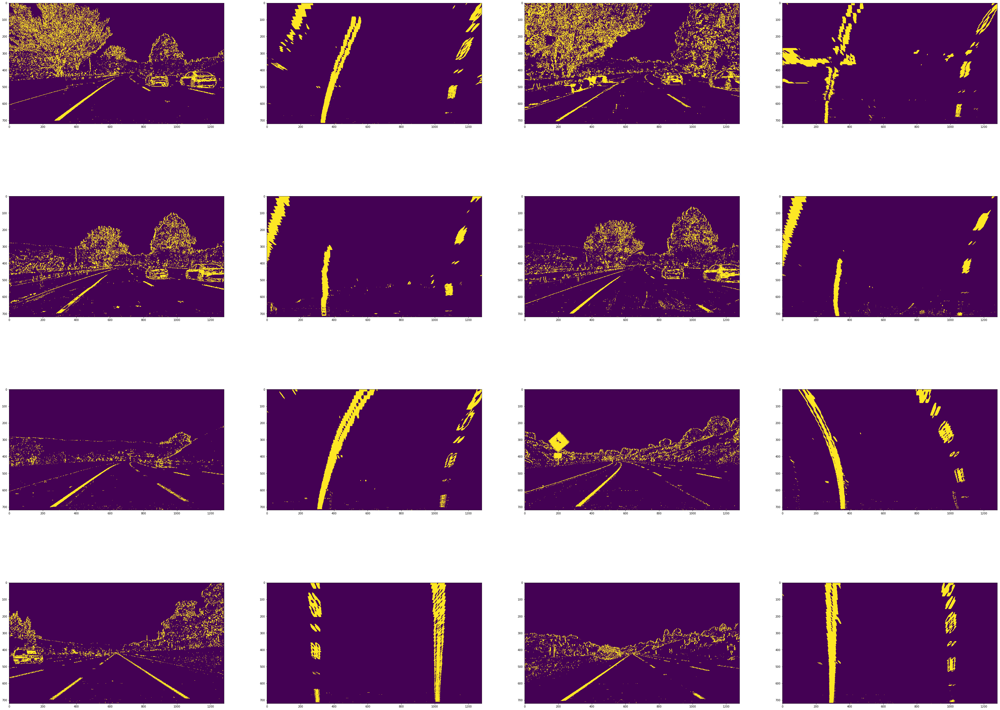

In [130]:
perspective_images = []
plt.figure(figsize=(25, 25))
for i in range(len(processed_images)):
    plt.subplot(4, 4, i * 2 + 1) 
    plt.imshow(processed_images[i])
    plt.subplot(4, 4, i * 2 + 2)
    perspective_image = perspective_transform(processed_images[i])
    perspective_images.append(perspective_image)
    cv2.imwrite("../output_images/perspective/"+ names[i] + '_perspective'+".png", perspective_image * 200) 
    plt.imshow(perspective_image)
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)

## 4. Find Lane Lines and Measure Lane Curvature
---

#### 1> Fine Lane Lines

In [131]:
def find_lane_pixels(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 15
    # Set the width of the windows +/- margin
    margin = 30
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img




#### 2> Fit Polynomial

In [132]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Visualization ##
    #Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return ploty, left_fit, right_fit, out_img, left_fitx, right_fitx



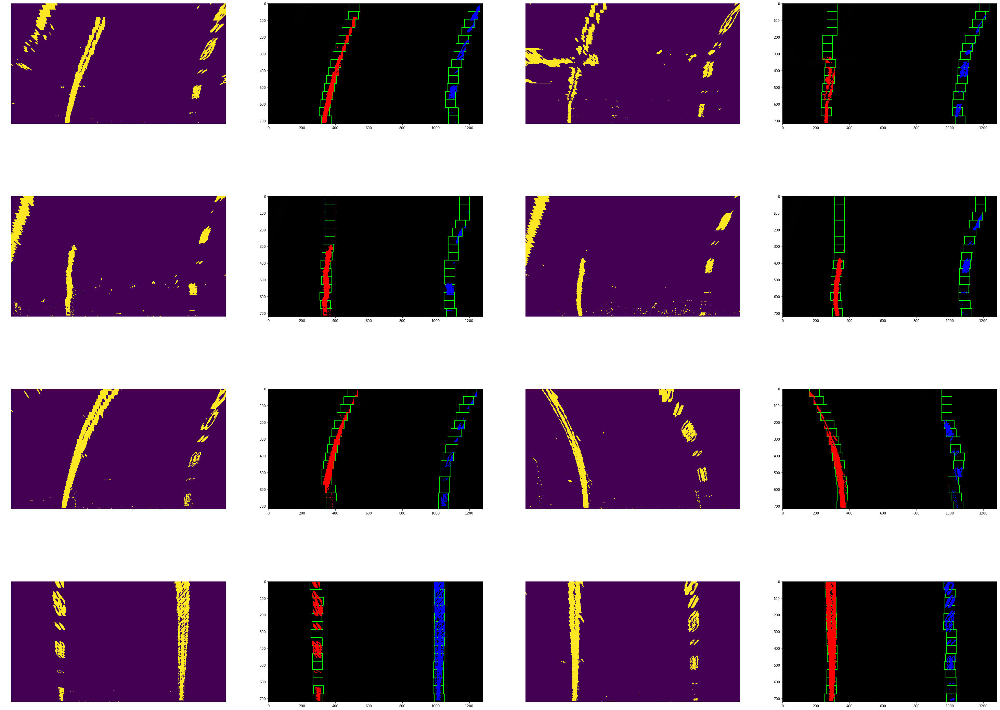

In [133]:
plt.figure(figsize=(20, 20))
plotys = []
left_fits = []
right_fits = []

for i in range(len(perspective_images)):
    plt.subplot(4, 4, i * 2 + 1)  
    plt.imshow(perspective_images[i])
    plt.axis('off')
    plt.subplot(4, 4, i * 2 + 2)  
    ploty, _, _, out_img, left_fit, right_fit = fit_polynomial(perspective_images[i])
    plotys.append(ploty)
    left_fits.append(left_fit)
    right_fits.append(right_fit)
    plt.imshow(out_img)
    cv2.imwrite("../output_images/fitted_images/"+ names[i] + '_fitted'+".png", out_img) 
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)

#### 4> Measure the curvature in practice

In [134]:
def measure_curvature_real(binary_warped):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/1280 # meters per pixel in x dimension
    
    # input data
    ploty, left_fit_cr, right_fit_cr, _, _, _ = fit_polynomial(binary_warped)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad


#### 4> Test on Image Examples

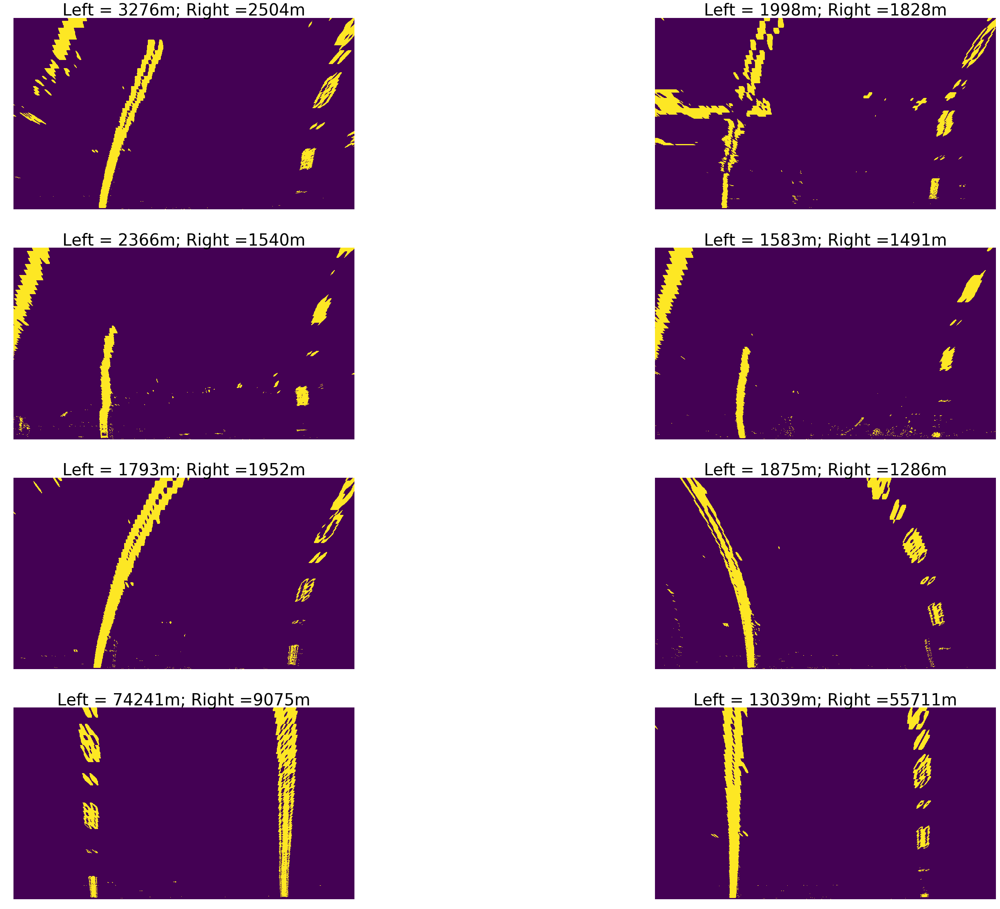

In [135]:
plt.figure(figsize=(20, 20))
left_curverads = []
right_curverads = []

for i in range(len(perspective_images)):
    plt.subplot(4, 2, i + 1) 
    plt.imshow(perspective_images[i])
    plt.axis('off')
    left_curverad, right_curverad = measure_curvature_real(perspective_images[i])
    left_curverads.append(left_curverad)
    right_curverads.append(right_curverad)
    plt.title('Left = ' + str(int(left_curverad)) + 'm; Right =' + str(int(right_curverad)) + 'm', fontsize = 40)
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)

#### 5> Wrap to the original images and draw lane lines

In [136]:
def wrap_back(warped, ploty, left_fitx, right_fitx):    
    '''
    Wrap to the original images and draw final figures
    '''
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    global Minv
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    return newwarp    


def output_image(original, warped, ploty, left_fitx, right_fitx, left_curvature, right_curvature):
    '''
    Calculate Car Position between two lines
    Add text on the out_put images with curvature and position
    '''
    newwarp = wrap_back(warped, ploty, left_fitx, right_fitx)
    combined_image = cv2.addWeighted(original, 1, newwarp, 0.3, 0)
    
    # Average Curvature
    curvature = (left_curvature + right_curvature) / 2
    
    # Write Text
    
    text = 'Curve Radius: ' + str(int(curvature)) + 'm'
    cv2.putText(combined_image, text, (50,70), cv2.FONT_HERSHEY_SIMPLEX, 1.5,  (255,255,0), 2, cv2.LINE_AA)
   
    # Vehicle Position
    xm_per_pix = 3.7/1280
    real_position = (left_fitx[0] + right_fitx[0]) / 2
    camera_center = warped.shape[1] / 2
    diff = (real_position - camera_center) * xm_per_pix
    
    # Write Text
    if diff >= 0:
        text = "{0:.2f}".format(abs(diff)) + 'm ' + ' right of center'
    else:
        text = "{0:.2f}".format(abs(diff)) + 'm ' + ' left of center'
    
    cv2.putText(combined_image, text, (50,120), cv2.FONT_HERSHEY_SIMPLEX, 1.5,  (255,255,0), 2, cv2.LINE_AA)
    
    return combined_image

#### 6> Test on Image Examples

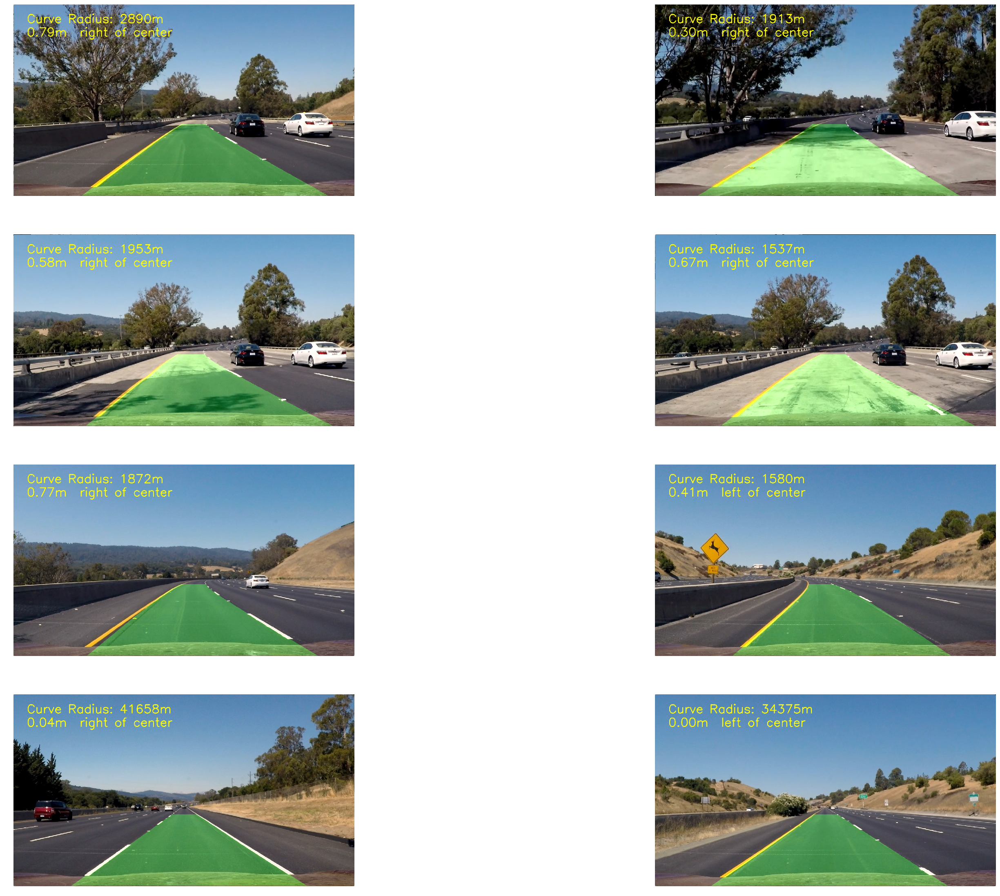

In [137]:
# Combine the result with the original image
plt.figure(figsize=(20, 20))

for i in range(len(input_images)):
    plt.subplot(4, 2, i + 1)  
    final_image = output_image(input_images[i], perspective_images[i], plotys[i], left_fits[i], right_fits[i], left_curverads[i], right_curverads[i])
    plt.imshow(final_image)
    plt.axis('off')  
    cv2.imwrite("../output_images/final_images/"+ names[i] + '_final'+".png", final_image) 
    plt.subplots_adjust(left=0., right=2, top=1.5, bottom=0.)

### 5. Test in video

#### 1> Define a Class to track the characteristics of each line detection

In [138]:
import collections

class Line():
    
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # Fit coefficients of last n iterations
        self.recent_polycoefficients = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  
        
    def throw_old_value(self):
        '''
         keep most recent values
        '''
        if len(self.recent_xfitted) > 10:
            self.recent_xfitted = self.recent_xfitted[-10:] 
            self.recent_polycoefficients = self.recent_polycoefficients[-10:]
        
        

#### 2>  Left - Right Lane Lines Sanity Check

In [139]:
def check_LeftRight(left_curvature, right_curvature, left_fitx, right_fitx):
    '''
     Checking that they have similar curvature
     Checking that they are separated by approximately the right distance horizontally
    '''
    similar_curvature = False
    parallel_distance = False
    
    ## Checking Similar Curvature
    if left_curvature or right_curvature > 10000:
        similar_curvature = True
    else:
        if (np.abs((left_curvature -  right_curvature) / (left_curvature + right_curvature) )) < 0.2 :
            similar_curvature = True 
    
    ## Checking parrallel and equal distance
    distance = right_fitx - left_fitx
    if np.abs((distance - np.mean(distance))/np.mean(distance)).all() < 0.1:
        parallel_distance = True
    
    return similar_curvature, parallel_distance
    

#### 3>  Use previous fit 

In [140]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    return left_fitx, right_fitx, ploty, left_fit, right_fit

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    left_lane_inds = ((nonzerox > (left_lines.current_fit[0]*(nonzeroy**2) + left_lines.current_fit[1]*nonzeroy + 
                    left_lines.current_fit[2] - margin)) & (nonzerox < (left_lines.current_fit[0]*(nonzeroy**2) + 
                    left_lines.current_fit[1]*nonzeroy + left_lines.current_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_lines.current_fit[0]*(nonzeroy**2) + right_lines.current_fit[1]*nonzeroy + 
                    right_lines.current_fit[2] - margin)) & (nonzerox < (right_lines.current_fit[0]*(nonzeroy**2) + 
                    right_lines.current_fit[1]*nonzeroy + right_lines.current_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty, left_fit, right_fit = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return left_fitx, right_fitx, ploty, left_fit, right_fit

def curvature_small_window(ploty, left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/1280 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

 #### 5> Video Process Pipeline

In [141]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(image):
    
    '''
    Video Pipeline
    Instances for tracking: left_lines, right_lines
    
    # Look-Ahead Filter ()
    # Reset (keep previous positions and if more than 3, reperform the histogram search)
    # Smoothing the results to provide a better presentation   

    '''
    
    ## Image ColorGradient Thresholding and image undistortion
    img = ColorGradient_Thresholding(image)
    
    ## Perspective Transform
    img = perspective_transform(img)
    
    ## Find Lane Lines
    ## Function: find_lane_pixels(binary_warped)
    ## Return: return leftx, lefty, rightx, righty, out_img
    ## Fit Lane Lines
    ## Function: fitpolynomial(binary_warped)
    ## Return:  ploty, left_fit, right_fit, out_img, left_fitx, right_fitx
    
    if left_lines.detected and right_lines.detected is True:
        
        
        ## Use the previous polynomial to skip the sliding window
        left_lines.allx, right_lines.allx, ploty, left_lines.current_fit, right_lines.current_fit =  search_around_poly(img)     
        left_lines.radius_of_curvature, right_lines.radius_of_curvature = curvature_small_window(ploty, left_lines.current_fit, right_lines.current_fit)
        left_lines.ally = ploty
        right_lines.ally = ploty
        
        ## Check Sanity
        similar_curvature, parallel_distance = check_LeftRight(left_lines.radius_of_curvature, right_lines.radius_of_curvature, left_lines.allx, right_lines.allx)
        
        if similar_curvature and parallel_distance is True:
            
            # x values of the last n fits of the line
            left_lines.recent_xfitted.append(left_lines.allx)
            right_lines.recent_xfitted.append(right_lines.allx)
            
            # Poly coefficients
            left_lines.recent_polycoefficients.append(left_lines.current_fit)
            right_lines.recent_polycoefficients.append(right_lines.current_fit)
            
            # Throw old value
            left_lines.throw_old_value()
            right_lines.throw_old_value()
            
            # average x values of the fitted line over the last n iterations
            left_lines.bestx = np.average(left_lines.recent_xfitted, axis = 0)     
            right_lines.bestx = np.average(right_lines.recent_xfitted, axis = 0)  
            
            # polynomial coefficients averaged over the last n iterations
            left_lines.best_fit = np.average(left_lines.recent_polycoefficients, axis = 0)
            right_lines.best_fit = np.average(right_lines.recent_polycoefficients, axis = 0)
           
            ## Change Flag
            left_lines.detected = True
            right_lines.detected = True
            
            ## Output Image 
            result = output_image(image, img, ploty, left_lines.bestx, right_lines.bestx, left_lines.radius_of_curvature, right_lines.radius_of_curvature) 
            
            # Flag Number Reset
            global flag_number
            flag_number = 0
            
        else:
            
            flag_number += 1
            
            ## Change Flag
            #left_lines.detected = True
            #right_lines.detected = True
            
            # average x values of the fitted line over the last n iterations
            left_lines.bestx = np.average(left_lines.recent_xfitted, axis = 0)     
            right_lines.bestx = np.average(right_lines.recent_xfitted, axis = 0) 
            
            # polynomial coefficients averaged over the last n iterations
            left_lines.best_fit = np.average(left_lines.recent_polycoefficients, axis = 0)
            right_lines.best_fit = np.average(right_lines.recent_polycoefficients, axis = 0)
            
            # radius (used previous fit)
            left_radius, right_radius = curvature_small_window(ploty, left_lines.best_fit, right_lines.best_fit)
            
            # Draw 
            result = output_image(image, img, ploty, left_lines.bestx, right_lines.bestx, left_radius, right_radius)
            
            ## Change Flag
            if flag_number > 7:
                left_lines.detected = False
                right_lines.detected = False
            
        
        
    else:
        
        ## New search for lane lines
        
        ## Fit Polynomial
        ploty, left_lines.current_fit, right_lines.current_fit, _, left_lines.allx, right_lines.allx  =  fit_polynomial(img)
        left_lines.ally = ploty
        right_lines.ally = ploty
        
        ## Calculate Radius
        left_lines.radius_of_curvature, right_lines.radius_of_curvature = measure_curvature_real(img)
        
        ## Add_fit
        left_lines.recent_xfitted.append(left_lines.allx)
        right_lines.recent_xfitted.append(right_lines.allx)
        
        ## Change Flag
        left_lines.detected = True
        right_lines.detected = True
        
        # x values of the last n fits of the line
        left_lines.recent_xfitted.append(left_lines.allx)
        right_lines.recent_xfitted.append(right_lines.allx)
        
        # Poly coefficients
        left_lines.recent_polycoefficients.append(left_lines.current_fit)
        right_lines.recent_polycoefficients.append(right_lines.current_fit)
        
        # Throw old value
        left_lines.throw_old_value()
        right_lines.throw_old_value()
        
        # average x values of the fitted line over the last n iterations
        left_lines.bestx = np.average(left_lines.recent_xfitted, axis = 0)     
        right_lines.bestx = np.average(right_lines.recent_xfitted, axis = 0)  
        
        # polynomial coefficients averaged over the last n iterations
        left_lines.best_fit = np.average(left_lines.recent_polycoefficients, axis = 0)
        right_lines.best_fit = np.average(right_lines.recent_polycoefficients, axis = 0)
        
        
        # radius
        left_radius, right_radius = curvature_small_window(ploty, left_lines.best_fit, right_lines.best_fit)
        
        # Flag Number Reset
        flag_number = 0
        
        ## Output Image 
        result = output_image(image, img, ploty, left_lines.bestx, right_lines.bestx, left_radius, right_radius)
        
    
    
    return result

 #### 6> Video Test

In [142]:
left_lines = Line()
right_lines = Line()
video_output1 = '../project_video_output.mp4'
video_input1 = VideoFileClip('../project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


100%|█████████▉| 1260/1261 [03:18<00:00,  6.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 3min 8s, sys: 42.7 s, total: 3min 50s
Wall time: 3min 19s
